<a href="https://colab.research.google.com/github/Aravindh4404/FYPSeagullClassification01/blob/main/Inception_HQ2_2111.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Using device: cuda
Mounted at /content/drive


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 153MB/s]


Epoch [1/20], Loss: 6.606107
Validation Accuracy: 80.24%
New best model saved with accuracy: 80.24% at /content/drive/My Drive/FYP/InceptionModel/HQ2ltst_20241121/best_model_inception_20241121.pth
Epoch [2/20], Loss: 2.499368
Validation Accuracy: 86.83%
New best model saved with accuracy: 86.83% at /content/drive/My Drive/FYP/InceptionModel/HQ2ltst_20241121/best_model_inception_20241121.pth
Epoch [3/20], Loss: 0.577475
Validation Accuracy: 95.81%
New best model saved with accuracy: 95.81% at /content/drive/My Drive/FYP/InceptionModel/HQ2ltst_20241121/best_model_inception_20241121.pth
Epoch [4/20], Loss: 0.289805
Validation Accuracy: 97.60%
New best model saved with accuracy: 97.60% at /content/drive/My Drive/FYP/InceptionModel/HQ2ltst_20241121/best_model_inception_20241121.pth
Epoch [5/20], Loss: 0.186902
Validation Accuracy: 98.20%
New best model saved with accuracy: 98.20% at /content/drive/My Drive/FYP/InceptionModel/HQ2ltst_20241121/best_model_inception_20241121.pth
Epoch [6/20], L

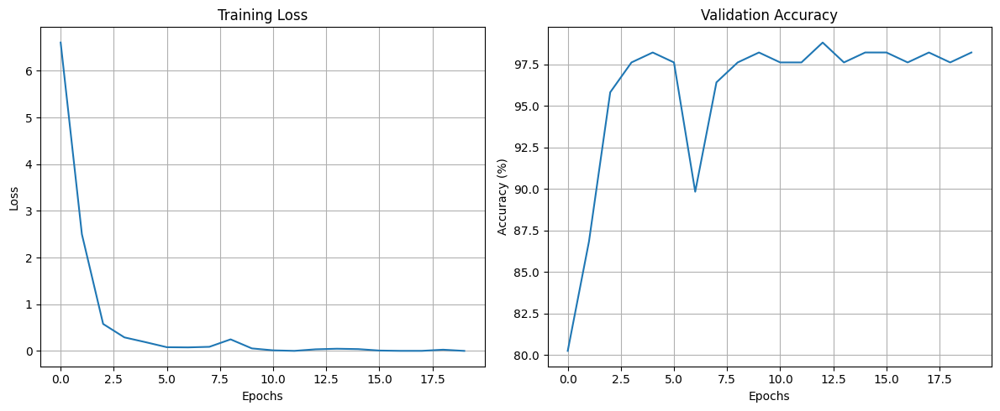

Final model saved at /content/drive/My Drive/FYP/InceptionModel/HQ2ltst_20241121/final_model_inception_20241121.pth
Test Loss: 1.195438, Test Accuracy: 87.10%


In [ ]:
# Import necessary libraries
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import random
import matplotlib.pyplot as plt
from datetime import datetime

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Define the device for computation
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Mount Google Drive to save and load the model (if using Google Colab)
from google.colab import drive
drive.mount('/content/drive')

# Define the folder to save model checkpoints
date_str = datetime.now().strftime('%Y%m%d')
checkpoint_folder = f'/content/drive/My Drive/FYP/InceptionModel/HQ2ltst_{date_str}/'
os.makedirs(checkpoint_folder, exist_ok=True)

# Data Augmentation for Training Set
transform_train = transforms.Compose([
    transforms.Resize((299, 299)),   # Inception v3 expects 299x299 input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
])

# Simple resizing for validation and test sets
transform_val_test = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
])

# Load datasets
data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/train'
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'
train_dataset = datasets.ImageFolder(data_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_data_path, transform=transform_val_test)

# Split the dataset into 80% training and 20% validation
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

# Create data loaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use Pre-trained Inception v3 model and modify it for binary classification
class InceptionV3Modified(nn.Module):
    def __init__(self):
        super(InceptionV3Modified, self).__init__()
        from torchvision.models import Inception_V3_Weights
        self.inception = models.inception_v3(weights=Inception_V3_Weights.IMAGENET1K_V1)
        # Replace the final fully connected layer to output 2 classes
        num_ftrs = self.inception.fc.in_features
        self.inception.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        # Use the auxiliary output during training to improve accuracy
        if self.training:
            aux, x = self.inception(x)
            return aux, x
        else:
            return self.inception(x)

# Initialize the Inception model
model = InceptionV3Modified().to(device)

# Define loss function and optimizer with L2 regularization (weight decay)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001146316711604839, weight_decay=0.0009719766132928495)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3)

# Training loop with learning rate scheduler
def train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20):
    best_acc = 0.0
    train_losses = []
    val_accuracies = []

    scaler = torch.amp.GradScaler()  # Mixed precision scaler
    aux_loss_weight = 0.3  # Adjustable auxiliary loss weight

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            with torch.amp.autocast(device_type='cuda'):
                aux_outputs, outputs = model(inputs)
                loss = criterion(outputs, labels) + aux_loss_weight * criterion(aux_outputs, labels)

            scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)  # Gradient clipping
            scaler.step(optimizer)
            scaler.update()

            running_loss += loss.item()

        # Print training loss
        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.6f}")

        # Validate the model
        val_acc = validate(model, val_loader, criterion)
        val_accuracies.append(val_acc)
        scheduler.step(val_acc)

        # Save the best model
        if val_acc > best_acc:
            best_acc = val_acc
            best_model_path = os.path.join(checkpoint_folder, f"best_model_inception_{date_str}.pth")
            torch.save(model.state_dict(), best_model_path)
            print(f"New best model saved with accuracy: {best_acc:.2f}% at {best_model_path}")

    # Plot training and validation metrics
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.title('Validation Accuracy')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Save the final model
    final_model_path = os.path.join(checkpoint_folder, f"final_model_inception_{date_str}.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"Final model saved at {final_model_path}")

# Validation loop returning accuracy
def validate(model, loader, criterion):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Validation Accuracy: {accuracy:.2f}%')
    return accuracy

# Test function to evaluate on the test set
def test(model, loader, criterion):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Test Loss: {test_loss/len(loader):.6f}, Test Accuracy: {accuracy:.2f}%')

# Step 1: Train the model with learning rate scheduling
train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20)

# Step 2: Evaluate the model on the test set
test(model, test_loader, criterion)


In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.1 MB/s eta 0:00:00


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import random
import optuna
from datetime import datetime

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the folder to save model checkpoints
date_str = datetime.now().strftime('%Y%m%d')
checkpoint_folder = f'/content/drive/My Drive/FYP/ModelCheckpointsHQltst_Inception_{date_str}/'
os.makedirs(checkpoint_folder, exist_ok=True)

# Define data transformations
transform_train = transforms.Compose([
    transforms.Resize((299, 299)),  # Inception v3 expects 299x299 input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
])

transform_val_test = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
])

# Load datasets
data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/train'
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'

train_dataset = datasets.ImageFolder(data_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_data_path, transform=transform_val_test)

# Split the dataset into 80% training and 20% validation
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

# Define validation function
def validate(model, loader, criterion):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

# Define the objective function for Optuna
def objective(trial, train_dataset, val_dataset, device):
    from torch.utils.data import DataLoader  # Import DataLoader

    # Suggest hyperparameters
    learning_rate = trial.suggest_float('lr', 1e-5, 1e-2, log=True)
    weight_decay = trial.suggest_float('weight_decay', 1e-6, 1e-2, log=True)
    batch_size = trial.suggest_categorical('batch_size', [8, 16, 32, 64])
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'SGD', 'AdamW'])

    # Create data loaders with the suggested batch size
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Define the model
    class InceptionV3Modified(nn.Module):
        def __init__(self):
            super(InceptionV3Modified, self).__init__()
            self.inception = models.inception_v3(pretrained=True)
            # Replace the final fully connected layer to output 2 classes
            num_ftrs = self.inception.fc.in_features
            self.inception.fc = nn.Sequential(
                nn.Dropout(0.5),
                nn.Linear(num_ftrs, 2)
            )

        def forward(self, x):
            if self.training:
                aux, x = self.inception(x)
                return aux, x
            else:
                return self.inception(x)

    model = InceptionV3Modified()
    model.to(device)

    # Define optimizer
    if optimizer_name == 'Adam':
        optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    elif optimizer_name == 'SGD':
        optimizer = optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay, momentum=0.9)
    elif optimizer_name == 'AdamW':
        optimizer = optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    # Define loss and scheduler
    criterion = nn.CrossEntropyLoss()
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3, verbose=True)

    # Training loop
    best_acc = 0.0
    for epoch in range(5):  # Use fewer epochs for faster optimization
        model.train()
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            aux_outputs, outputs = model(inputs)
            loss = criterion(outputs, labels) + 0.4 * criterion(aux_outputs, labels)
            loss.backward()
            optimizer.step()

        # Validate and track best accuracy
        val_acc = validate(model, val_loader, criterion)
        best_acc = max(best_acc, val_acc)
        scheduler.step(val_acc)

    return best_acc

# Run Optuna
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

study = optuna.create_study(direction='maximize')
study.optimize(lambda trial: objective(trial, train_dataset, val_dataset, device), n_trials=20)

# Print best parameters and accuracy
print("Best Hyperparameters:")
print(study.best_params)
print(f"Best Validation Accuracy: {study.best_value:.2f}%")

# Use best hyperparameters to retrain and evaluate on the test set
best_hyperparameters = study.best_params
batch_size = best_hyperparameters['batch_size']

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

final_model = InceptionV3Modified()
final_optimizer = optim.AdamW(final_model.parameters(), lr=best_hyperparameters['lr'], weight_decay=best_hyperparameters['weight_decay'])
final_model.to(device)

# Define a training loop function (from your existing code)
def train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20):
    for epoch in range(epochs):
        model.train()
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            aux_outputs, outputs = model(inputs)
            loss = criterion(outputs, labels) + 0.4 * criterion(aux_outputs, labels)
            loss.backward()
            optimizer.step()

        val_acc = validate(model, val_loader, criterion)
        scheduler.step(val_acc)

# Train and test
scheduler = optim.lr_scheduler.ReduceLROnPlateau(final_optimizer, mode='max', factor=0.1, patience=3, verbose=False)
train(final_model, train_loader, val_loader, criterion, final_optimizer, scheduler, epochs=10)

def test(model, loader, criterion):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Test Loss: {test_loss/len(loader):.6f}, Test Accuracy: {accuracy:.2f}%')

# Evaluate the final model on the test set
test(final_model, test_loader, criterion)


Mounted at /content/drive


[I 2024-11-18 15:13:37,077] A new study created in memory with name: no-name-ea52d8ab-c337-447b-8764-df5a4c44db93
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 142MB/s] 
/usr/local/lib/python3.10/dist-packages/torch/opt

Best Hyperparameters:
{'lr': 0.0001146316711604839, 'weight_decay': 0.0009719766132928495, 'batch_size': 32, 'optimizer': 'AdamW'}
Best Validation Accuracy: 99.37%


NameError: name 'InceptionV3Modified' is not defined

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import random
import optuna
from optuna.samplers import TPESampler

# Mount Google Drive to save and load the model (if using Google Colab)
from google.colab import drive
drive.mount('/content/drive')

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Define the InceptionV3Modified class for binary classification
class InceptionV3Modified(nn.Module):
    def __init__(self):
        super(InceptionV3Modified, self).__init__()
        self.inception = models.inception_v3(weights='IMAGENET1K_V1')
        # Replace the final fully connected layer to output 2 classes
        num_ftrs = self.inception.fc.in_features
        self.inception.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        if self.training:
            aux, x = self.inception(x)
            return aux, x
        else:
            return self.inception(x)

# Data transformations and loading
transform_train = transforms.Compose([
    transforms.Resize((299, 299)),   # Inception v3 expects 299x299 input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
])

transform_val_test = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
])

# Define paths for training and validation datasets
data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/train'
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'
train_dataset = datasets.ImageFolder(data_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_data_path, transform=transform_val_test)

# Split the dataset into 80% training and 20% validation
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

# Validation function for accuracy
def validate(model, loader, criterion):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    return accuracy

# Define the Objective Function for Hyperparameter Tuning
def objective(trial):
    # Hyperparameter suggestions
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
    batch_size = trial.suggest_categorical("batch_size", [16, 32, 64])
    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "SGD"])
    weight_decay = trial.suggest_float("weight_decay", 1e-5, 1e-2, log=True)
    aux_weight = trial.suggest_float("aux_weight", 0.1, 0.5)

    # Initialize model
    model = InceptionV3Modified()
    criterion = nn.CrossEntropyLoss()

    # Optimizer selection and configuration
    if optimizer_name == "Adam":
        optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    else:
        momentum = trial.suggest_float("momentum", 0.7, 0.99)
        optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=momentum, weight_decay=weight_decay)

    # Scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3)

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Short training loop for hyperparameter tuning
    best_val_acc = 0.0
    for epoch in range(5):  # Using fewer epochs for faster tuning
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            aux_outputs, outputs = model(inputs)
            loss = criterion(outputs, labels) + aux_weight * criterion(aux_outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        # Validate and track best validation accuracy
        val_acc = validate(model, val_loader, criterion)
        scheduler.step(val_acc)
        best_val_acc = max(best_val_acc, val_acc)

        # Early stopping for poor-performing trials
        trial.report(val_acc, epoch)
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    return best_val_acc

# Run Optuna Study
sampler = TPESampler()
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=20)

# Print best parameters and results
best_params = study.best_params
print("Best hyperparameters:", best_params)
print("Best validation accuracy:", study.best_value)


ModuleNotFoundError: No module named 'optuna'

# Use this in terminal:
# %pip install optuna-dashboard
# %optuna-dashboard sqlite:///optuna_study.db

In [ ]:
# Extract best parameters from the Optuna study
final_batch_size = best_params['batch_size']
final_learning_rate = best_params['learning_rate']
final_optimizer_name = best_params['optimizer']
final_weight_decay = best_params['weight_decay']
final_aux_weight = best_params['aux_weight']

# Initialize model with best parameters
model = InceptionV3Modified()
criterion = nn.CrossEntropyLoss()

# Configure optimizer with best parameters
if final_optimizer_name == "Adam":
    optimizer = optim.Adam(model.parameters(), lr=final_learning_rate, weight_decay=final_weight_decay)
else:
    optimizer = optim.SGD(model.parameters(), lr=final_learning_rate, momentum=best_params.get("momentum", 0.9), weight_decay=final_weight_decay)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3)
train_loader = DataLoader(train_dataset, batch_size=final_batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=final_batch_size, shuffle=False)

# Full training loop using best parameters
def train_with_best_params(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20):
    best_acc = 0.0
    train_losses, val_accuracies = [], []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            aux_outputs, outputs = model(inputs)
            loss = criterion(outputs, labels) + final_aux_weight * criterion(aux_outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        # Validate and record accuracy
        val_acc = validate(model, val_loader, criterion)
        scheduler.step(val_acc)
        train_losses.append(running_loss / len(train_loader))
        val_accuracies.append(val_acc)
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_losses[-1]:.6f}, Val Accuracy: {val_acc:.2f}%")

        # Save best model
        if val_acc > best_acc:
            best_acc = val_acc
            best_model_path = os.path.join(checkpoint_folder, f"best_model_inception_{date_str}.pth")
            torch.save(model.state_dict(), best_model_path)
            print(f"New best model saved with accuracy: {best_acc:.2f}% at {best_model_path}")

    # Plot training loss and validation accuracy
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.title('Validation Accuracy')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Train with the best hyperparameters from Optuna
train_with_best_params(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20)

Mounted at /content/drive


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 174MB/s] 
<ipython-input-1-aa299babbdef>:44: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle m

Model loaded from /content/drive/My Drive/FYP/ModelCheckpointsHQltst_Inception_20241101/final_model_inception_20241101.pth


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


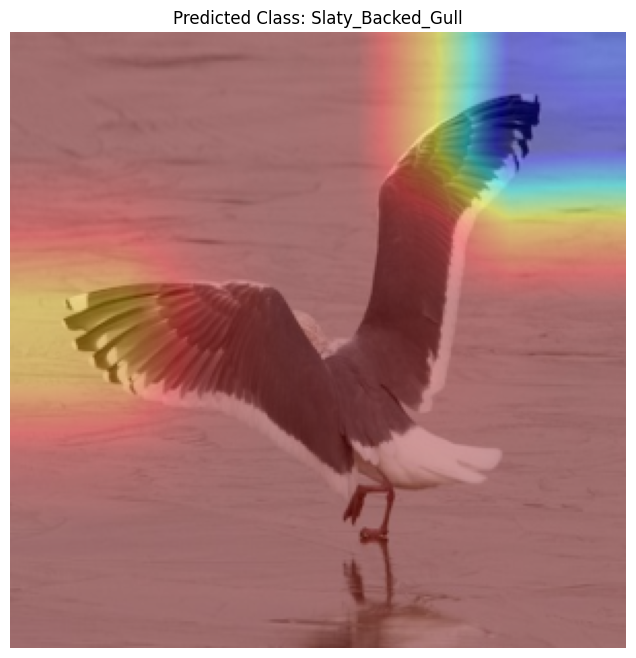

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive to load the model and image
from google.colab import drive
drive.mount('/content/drive')

# Path to the saved model and test image
checkpoint_path = '/content/drive/My Drive/FYP/ModelCheckpointsHQltst_Inception_20241101/final_model_inception_20241101.pth'
image_path = '/content/480 (40).jpeg'  # Update with actual test image path

# Define image transformation to match model input
transform = transforms.Compose([
    transforms.Resize((299, 299)),   # Inception v3 expects 299x299 input size
    transforms.ToTensor(),
])

# Define the modified Inception model with your custom fully connected layer
class InceptionV3Modified(nn.Module):
    def __init__(self):
        super(InceptionV3Modified, self).__init__()
        self.inception = models.inception_v3(pretrained=True)
        # Replace the final fully connected layer to output 2 classes
        num_ftrs = self.inception.fc.in_features
        self.inception.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        if self.training:
            aux, x = self.inception(x)
            return aux, x
        else:
            return self.inception(x)

# Load the saved model weights
model = InceptionV3Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

print(f"Model loaded from {checkpoint_path}")

# Class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']  # Adjust based on your class order

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Function to generate Grad-CAM heatmap and show predicted class
def generate_gradcam_inception(model, image_tensor, target_layer, class_names):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture feature maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the target layer
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()
    predicted_class = class_names[predicted_class_idx]

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and feature maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1, 2))  # Global average pooling of gradients
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1

    # Convert original image for heatmap overlay
    original_image = image_tensor.squeeze().permute(1, 2, 0).cpu().numpy()
    original_image = (original_image - np.min(original_image)) / (np.max(original_image) - np.min(original_image))

    # Create heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_image = 0.4 * heatmap + 0.6 * original_image

    # Show the image with the predicted class name
    plt.figure(figsize=(8, 8))
    plt.title(f"Predicted Class: {predicted_class}")
    plt.imshow(cam_image)
    plt.axis('off')
    plt.show()

    # Remove hooks
    hook1.remove()
    hook2.remove()

# Set the target layer for Grad-CAM
target_layer = model.inception.Mixed_7c  # Last convolutional layer in Inception v3

# Preprocess the image
image_tensor = preprocess_image(image_path)

# Generate Grad-CAM for the specific image and show the predicted class
generate_gradcam_inception(model, image_tensor, target_layer, class_names)


<ipython-input-8-ace1e20e4102>:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))


Model loaded from /content/drive/My Drive/FYP/ModelCheckpointsHQltst_Inception_20241101/final_model_inception_20241101.pth


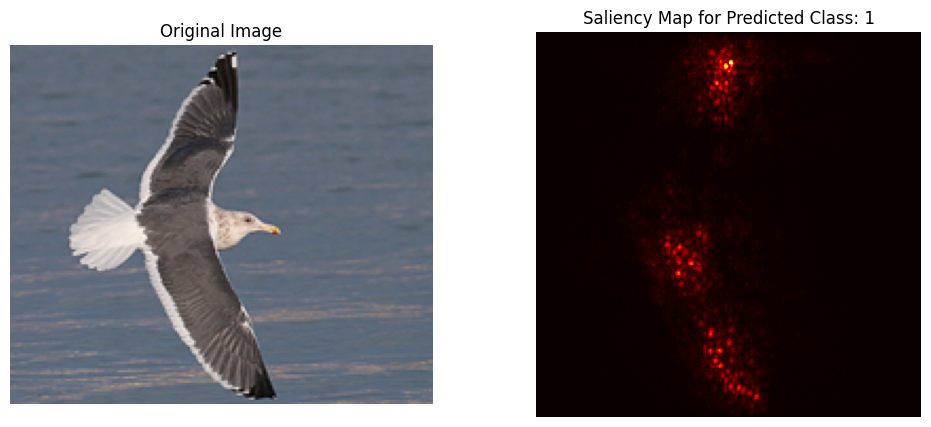

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Load your modified Inception model
class InceptionV3Modified(nn.Module):
    def __init__(self):
        super(InceptionV3Modified, self).__init__()
        self.inception = models.inception_v3(pretrained=True)
        # Replace the final fully connected layer to output 2 classes
        num_ftrs = self.inception.fc.in_features
        self.inception.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        if self.training:
            aux, x = self.inception(x)
            return aux, x
        else:
            return self.inception(x)

# Load the trained model
checkpoint_path = '/content/drive/My Drive/FYP/ModelCheckpointsHQltst_Inception_20241101/final_model_inception_20241101.pth'
model = InceptionV3Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()
print(f"Model loaded from {checkpoint_path}")

# Define image transformation to match model input size
transform = transforms.Compose([
    transforms.Resize((299, 299)),  # Inception v3 expects 299x299 input size
    transforms.ToTensor(),
])

# Load and preprocess an image
image_path = '/content/12122592614_c72807ccf6_k.jpg'  # Update with your test image path
image = Image.open(image_path).convert("RGB")
input_image = transform(image).unsqueeze(0)  # Add batch dimension

# Set requires_grad to True for the saliency map
input_image.requires_grad_()

# Forward pass
output = model(input_image)
target_class = output.argmax(dim=1)  # Get the top predicted class

# Backward pass to calculate gradients of target class with respect to input
model.zero_grad()
output[0, target_class].backward()

# Calculate saliency by taking the absolute value of the gradients
saliency = input_image.grad.data.abs()
saliency, _ = torch.max(saliency, dim=1)  # Take the max across color channels
saliency = saliency.squeeze().cpu().numpy()  # Convert to numpy for plotting

# Normalize the saliency map for better visualization
saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())

# Display the original image and saliency map
plt.figure(figsize=(12, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(np.array(image))
plt.title("Original Image")
plt.axis('off')

# Saliency Map
plt.subplot(1, 2, 2)
plt.imshow(saliency, cmap='hot')
plt.title(f"Saliency Map for Predicted Class: {target_class.item()}")
plt.axis('off')

plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-3-14976b5f1339>:39: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for mor

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/imageRTEs.jpg


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


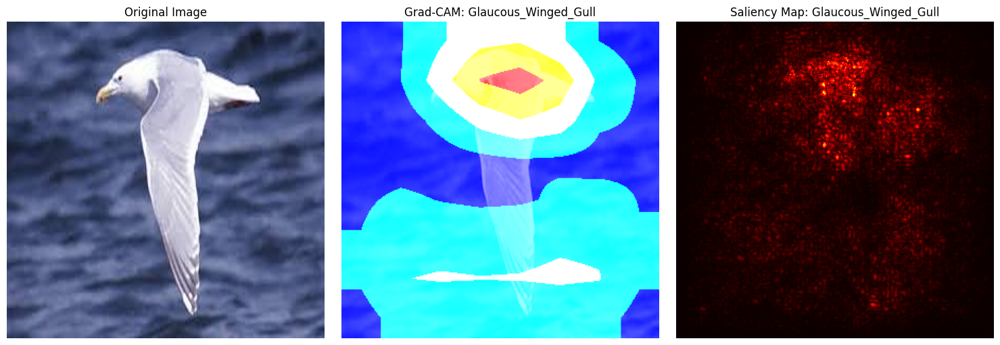

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/iDFGmages.jpg


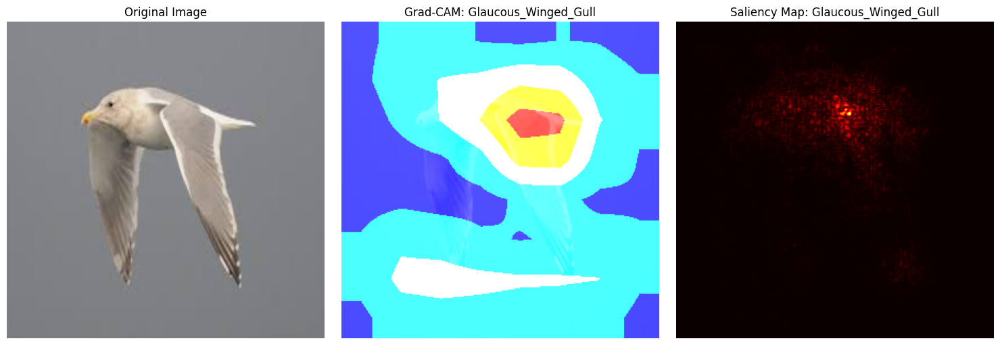

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/images.jpg


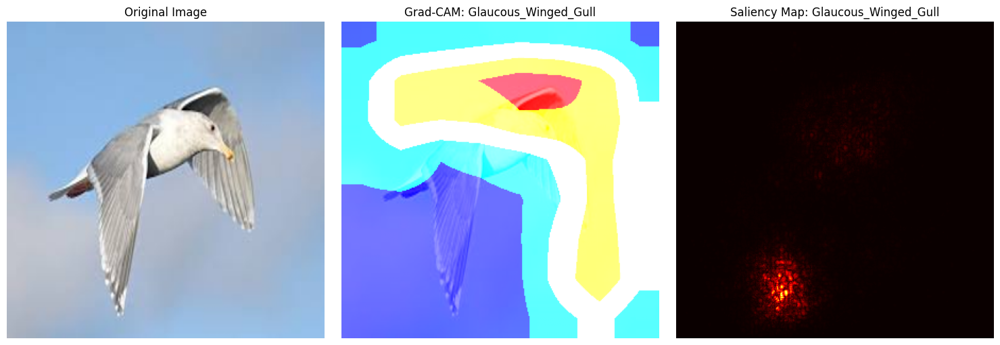

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/900 - 2024-10-22T213920.718.jpg


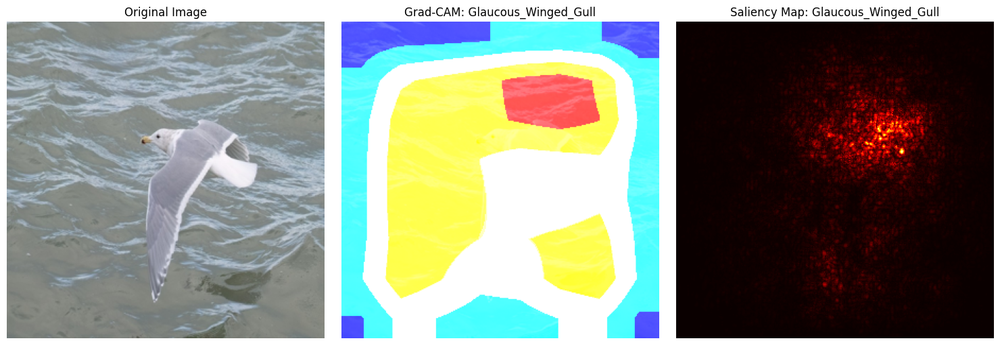

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/480 (11).jpeg


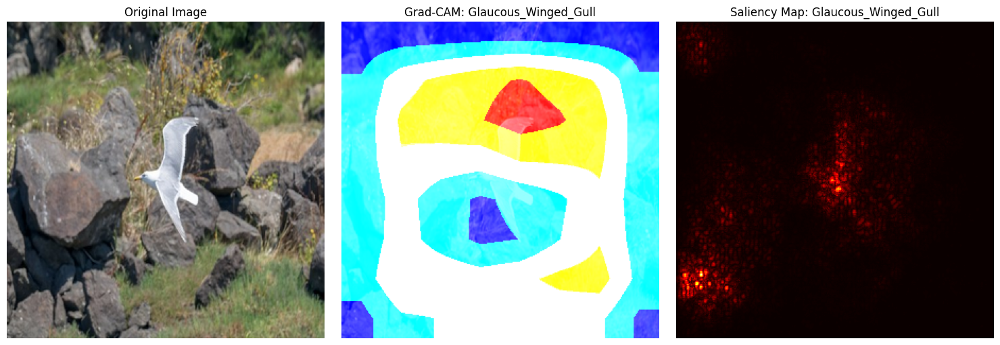

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/320 (5).jpeg


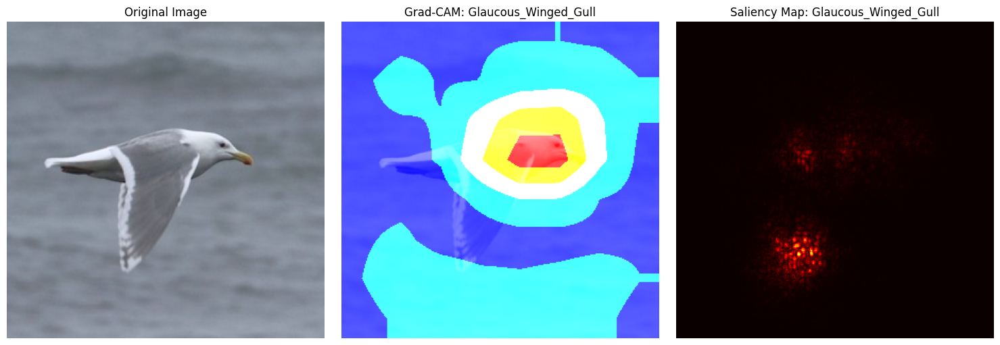

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (14).jpeg


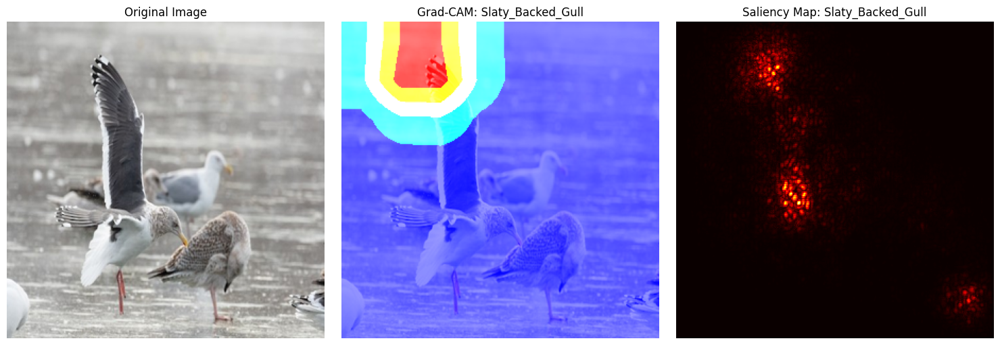

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (34).jpeg


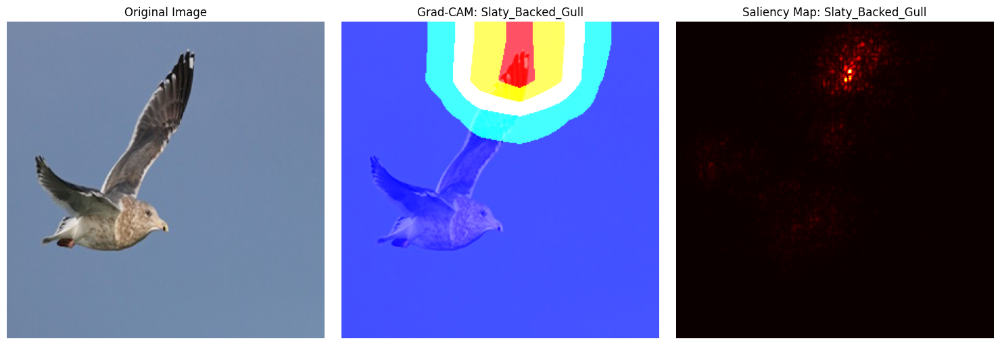

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (42).jpeg


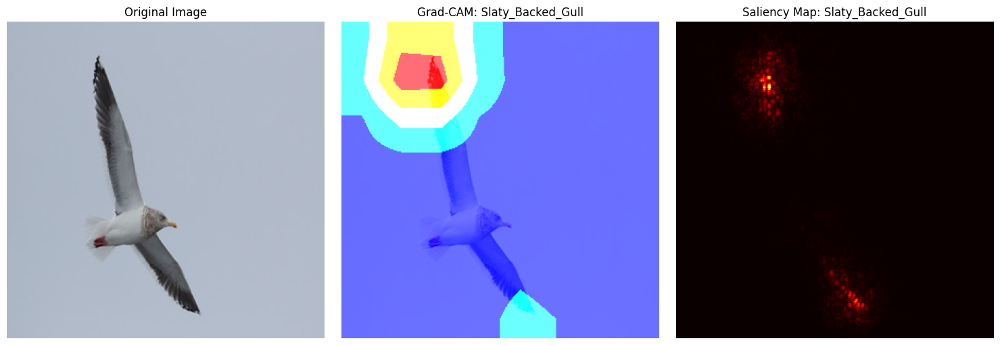

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (52).jpeg


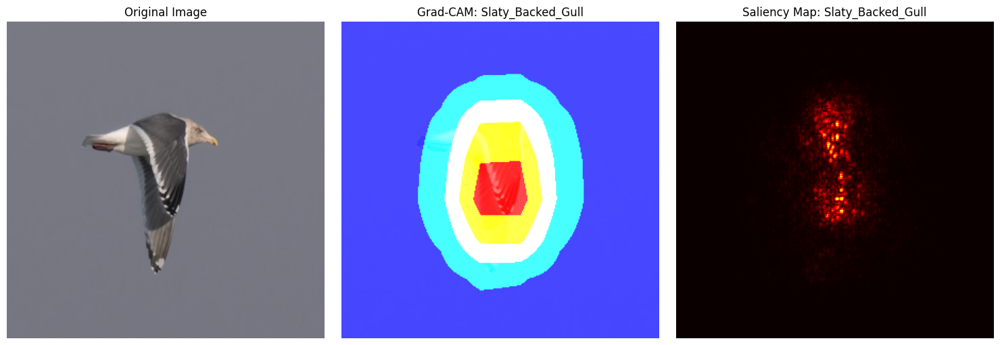

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (10).jpeg


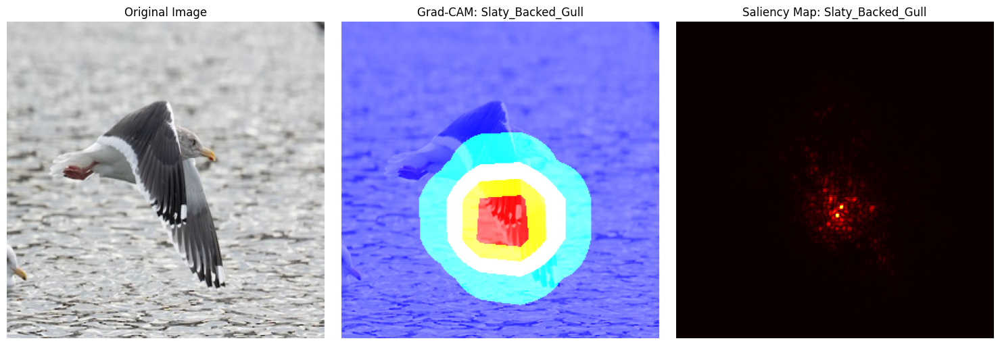

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (28).jpeg


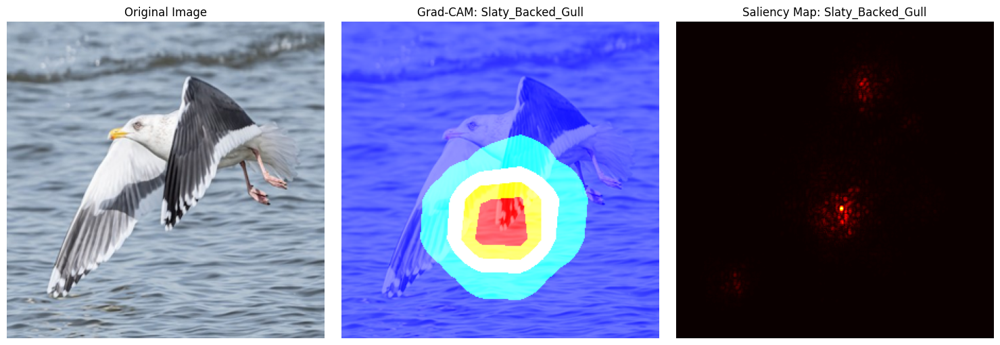

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (49).jpeg


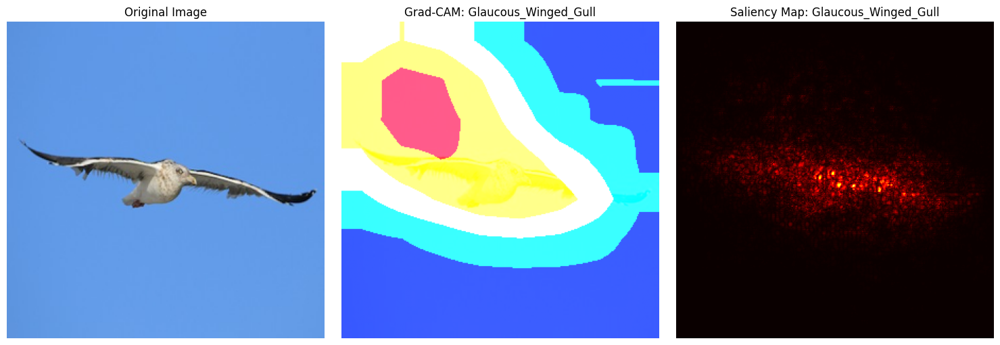

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/007.jpg


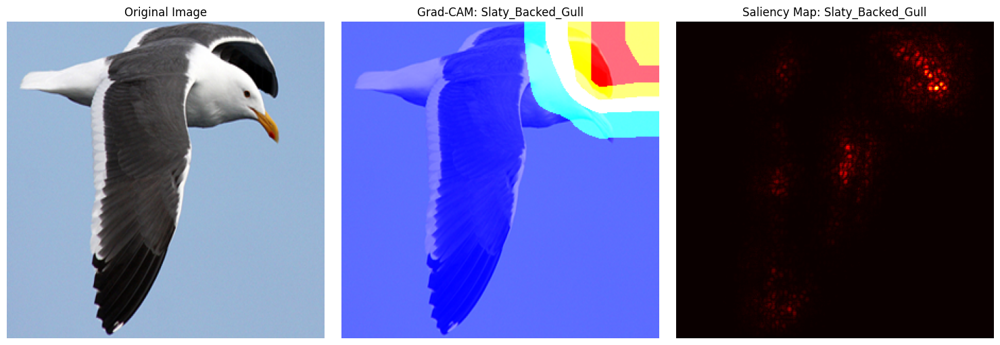

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (3).jpeg


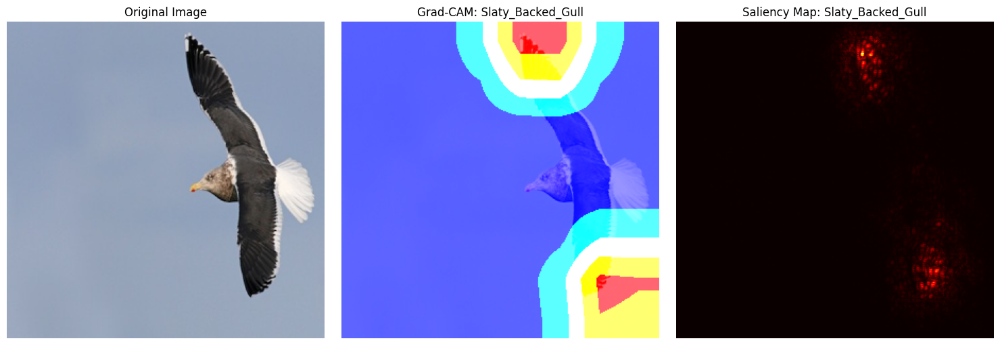

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (32).jpeg


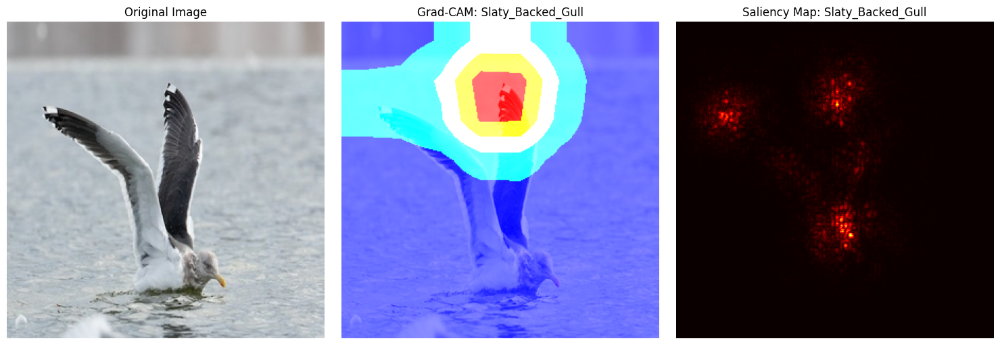

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (9).jpeg


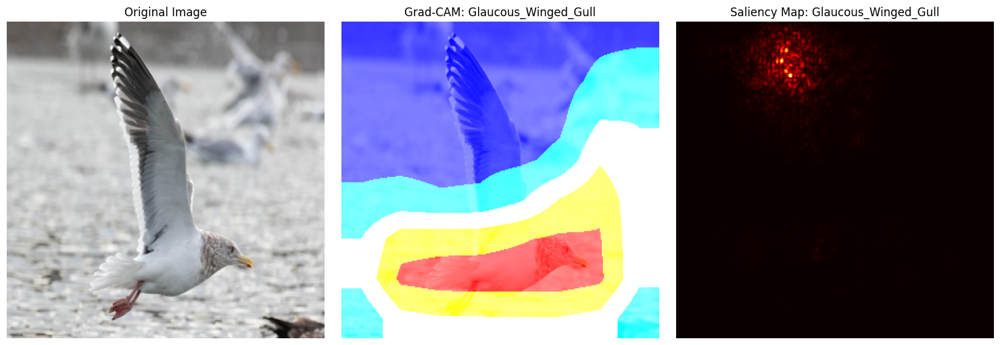

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (53).jpeg


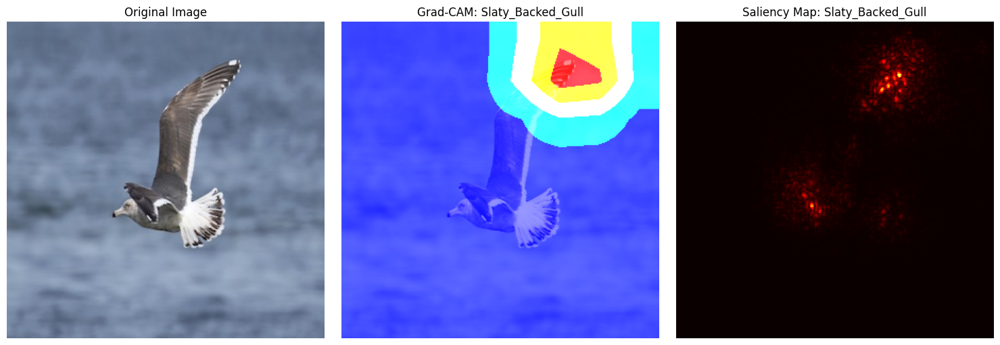

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (29).jpeg


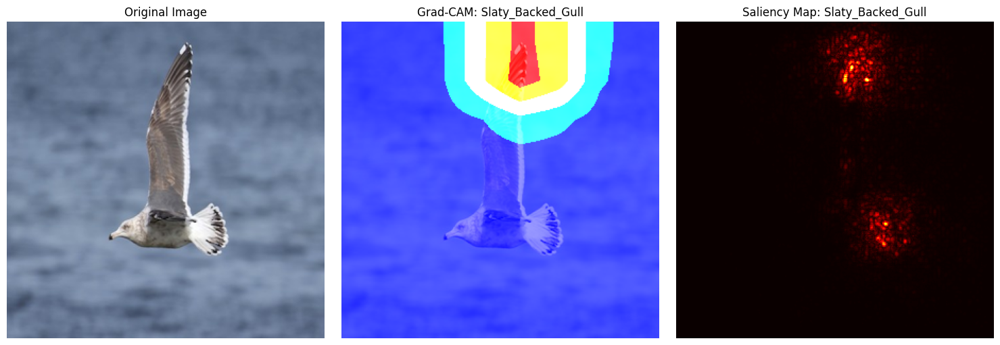

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (19).jpeg


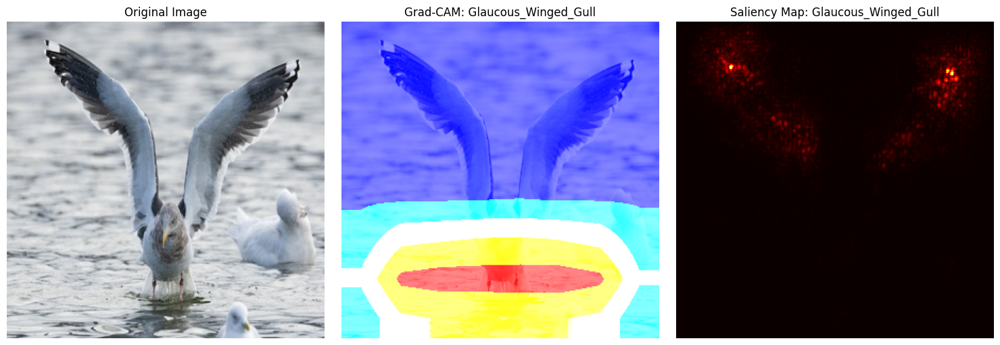

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (21).jpeg


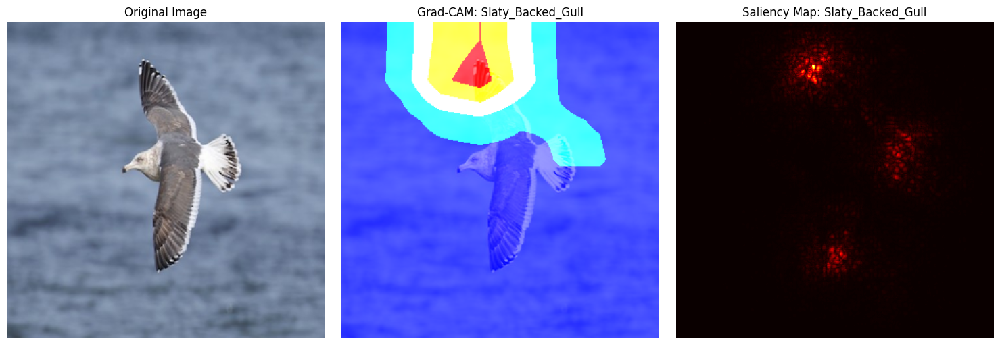

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (33).jpeg


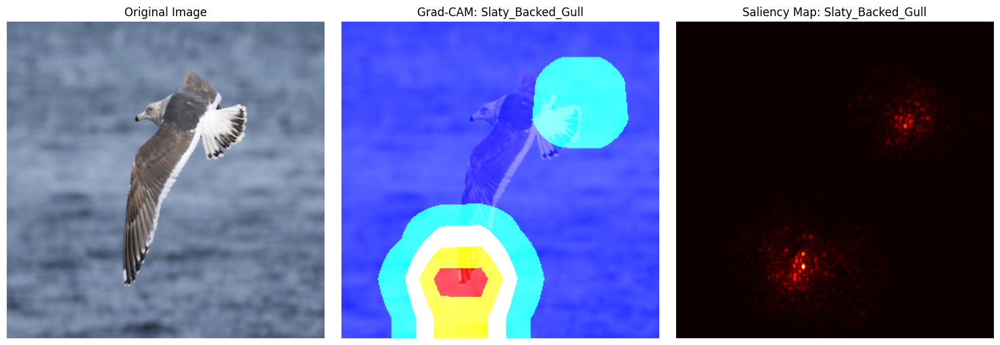

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (6).jpeg


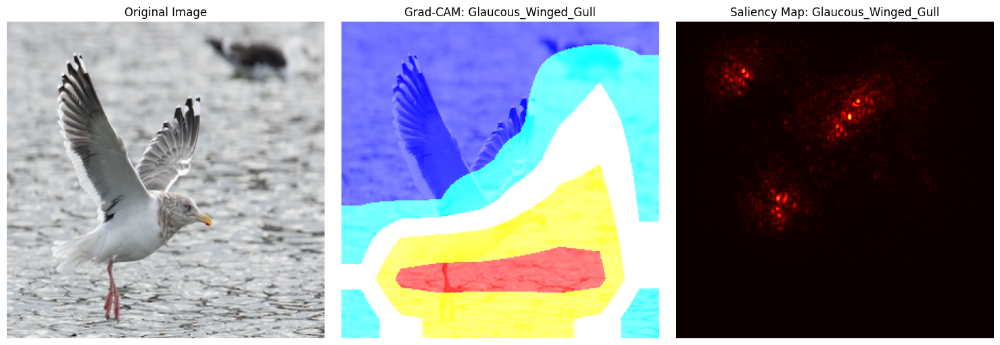

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/011sm.jpg


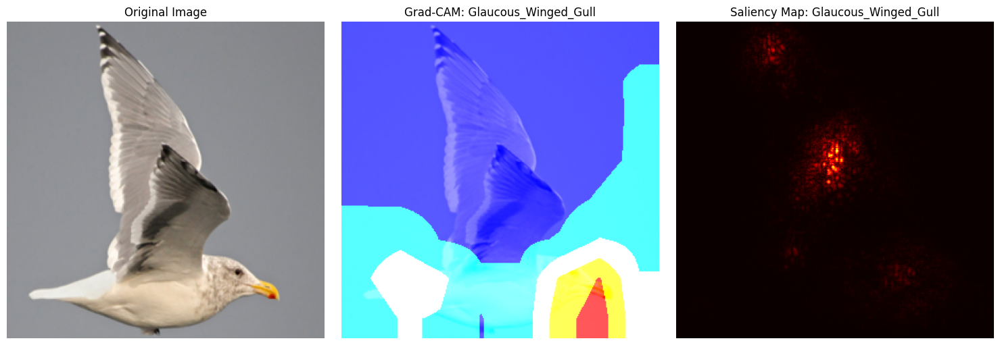

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (45).jpeg


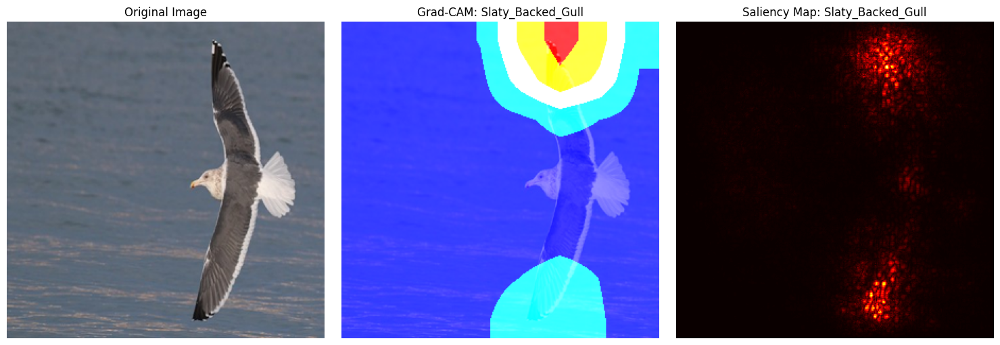

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (40).jpeg


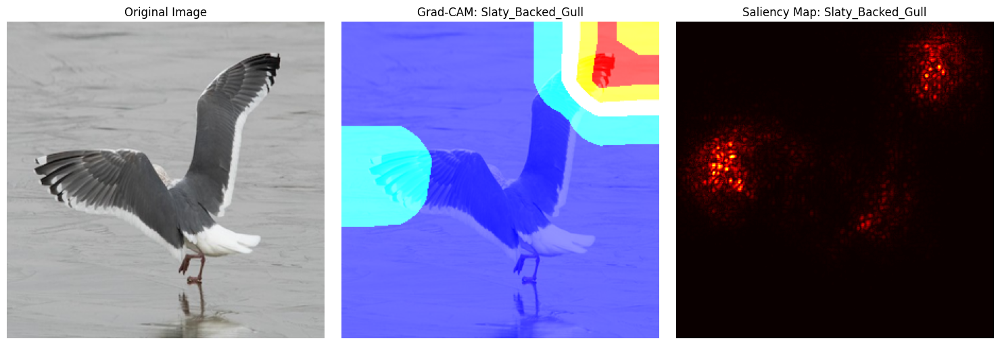

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (7).jpeg


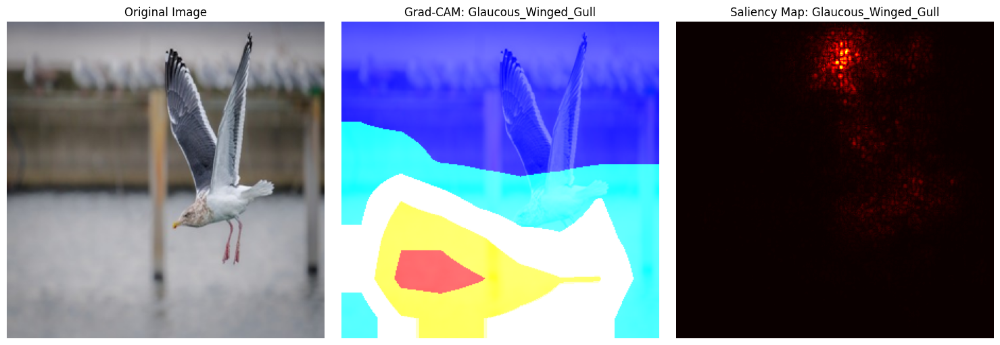

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (54).jpeg


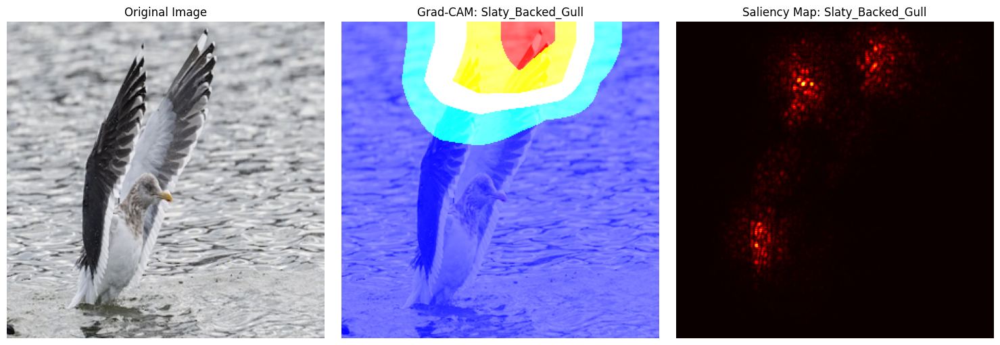

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (41).jpeg


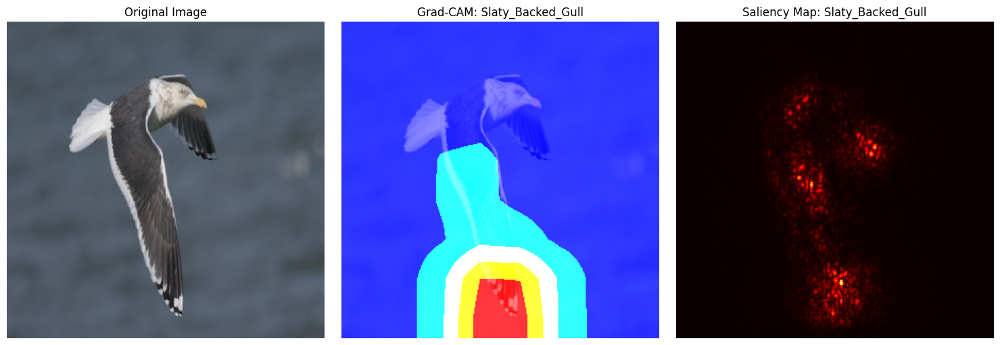

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (15).jpeg


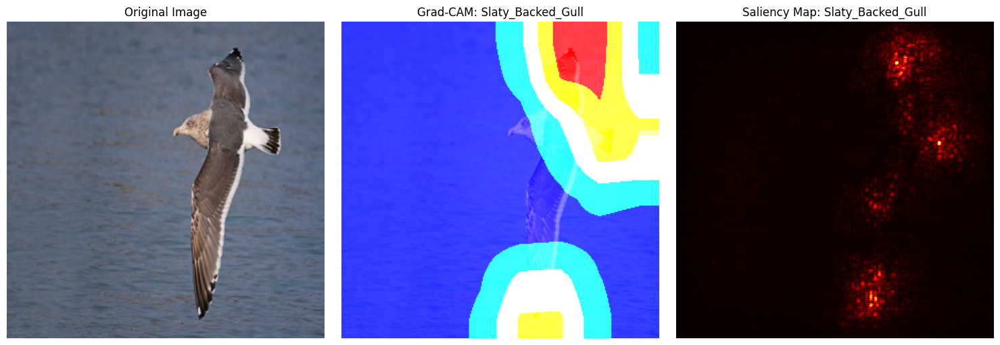

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (1).jpeg


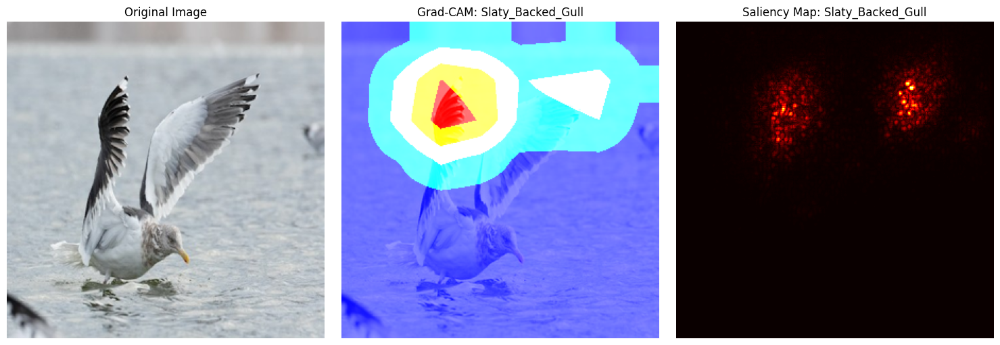

In [3]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models, datasets
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/ModelCheckpointsHQltst_Inception_20241101/final_model_inception_20241101.pth'
test_folder_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'  # Replace with your test folder path

# Define the modified Inception model
class InceptionV3Modified(nn.Module):
    def __init__(self):
        super(InceptionV3Modified, self).__init__()
        self.inception = models.inception_v3(pretrained=True)
        # Replace the final fully connected layer to output 2 classes
        num_ftrs = self.inception.fc.in_features
        self.inception.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        if self.training:
            aux, x = self.inception(x)
            return aux, x
        else:
            return self.inception(x)

# Load the trained model
model = InceptionV3Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']  # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((299, 299)),   # Inception v3 expects 299x299 input size
    transforms.ToTensor(),
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Grad-CAM implementation
def generate_gradcam(model, image_tensor, target_layer):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture feature maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the target layer
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and feature maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1, 2))  # Global average pooling of gradients
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1
    return cam, predicted_class_idx

# Saliency Map implementation
def generate_saliency_map(model, image_tensor):
    image_tensor.requires_grad_()
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to calculate gradients
    model.zero_grad()
    output[0, predicted_class_idx].backward()

    # Calculate saliency
    saliency = image_tensor.grad.data.abs()
    saliency, _ = torch.max(saliency, dim=1)  # Take max across channels
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize for visualization
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency, predicted_class_idx

# Function to visualize results
def visualize_results(image_path, gradcam, saliency, predicted_class):
    original_image = Image.open(image_path).resize((299, 299))
    original_image = np.array(original_image)

    # Grad-CAM heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    gradcam_image = 0.4 * heatmap + 0.6 * original_image / 255.0

    # Plot images
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Grad-CAM
    plt.subplot(1, 3, 2)
    plt.title(f"Grad-CAM: {class_names[predicted_class]}")
    plt.imshow(gradcam_image)
    plt.axis('off')

    # Saliency Map
    plt.subplot(1, 3, 3)
    plt.title(f"Saliency Map: {class_names[predicted_class]}")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process all images in the test folder
def process_test_folder(test_folder_path):
    target_layer = model.inception.Mixed_7c  # Target last convolutional layer
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Generate Grad-CAM and Saliency Map
            gradcam, predicted_class_idx_cam = generate_gradcam(model, image_tensor, target_layer)
            saliency, predicted_class_idx_sal = generate_saliency_map(model, image_tensor)

            # Ensure predictions from both methods match
            assert predicted_class_idx_cam == predicted_class_idx_sal, "Predicted class mismatch!"

            # Visualize results
            visualize_results(image_path, gradcam, saliency, predicted_class_idx_cam)

# Run the combined implementation on all images in the test folder
process_test_folder(test_folder_path)
